# **CV Final Project: Raccoon Dataset Generation**

Group Members:
*   Giorgia Iacobellis
*   Thiago Amado
*   Laurids Radtke

The goal of this notebook is to generate new Raccoon images with a pretrained model from the [Diffusers library](https://huggingface.co/docs/diffusers/index) and to retrain an already existing model to investigate if those images are useful for training improvements.

With the best YOLOv8 pretrained model of previous assigments for the raccoon object detection, we retrain the existing model on the new dataset and compare the results to see if the performance improves with the new images. We also compared the results to another pretrained model to see if differences exist.

The original dataset used to do the training of the best model was created by combining a dataset from [Kaggle](https://www.kaggle.com/datasets/antoreepjana/animals-detection-images-dataset/data/) (Selecting only the Raccon folder) and from [Roboflow](https://universe.roboflow.com/raccoondetector/raccoon-finder/).

New images are generated following this pipeline:
- Via text generator random prompts of descriptions of images depicting raccoons were created
- These descriptions were passed to the image generator model which generated the new images from them
- All newly generated images were annotated and some augmentation was applied on the Roboflow

The [new dataset](https://universe.roboflow.com/racoonsimgenthiagocosta/raccoon-imgen-thiago-costa) is composed of 380 images and we used data augmentation to increase that number. We were not able to generate more images due to limitation in the environment and long processing times. 

The dataset was then used to do transfer learning using the pretrained model that gave the best result in the previous assignment.

The model with the best performance on the previous assignment is:
* YOLO S with 2000 images and 100 epochs (other parameters are default, so batch_size=16, lr0=0.1, lrf=0.1, optimizer=auto)

To retrain we decided to use the same hyperparmeters, to be able to compare them.


## Strategy
- From Diffusers import an Image Generator Pipeline
- Generate sentences about raccoons with a generative language model, GPT2
- Save the images generated in a folder
- Augment the dataset with Roboflow
- Label the new images with Roboflow
- Take the model from the previous raccoon project
- Do some validations on the models and save the results
- Retrain the models using the new images
- Do validations on the retrained model
- Compare the validations


## Environment preparation

This section relates to all imports and installations required to run the code.

In [ ]:
!pip install kaggle
!pip install transformers
!pip install wandb
!pip install diffusers==0.10.2 transformers scipy ftfy accelerate
!pip install ultralytics==8.0.196

In [ ]:
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import torch
from PIL import Image
from torch import autocast
from transformers import GPT2Tokenizer, GPT2LMHeadModel , pipeline
from diffusers import StableDiffusionPipeline
from transformers import pipeline
import ultralytics
from ultralytics import YOLO
from IPython.display import Image
ultralytics.checks()

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!cd /content/gdrive/MyDrive

In [ ]:
%load_ext tensorboard

In [ ]:
path_raccoon_imgen = '/content/gdrive/MyDrive/final-proj/data/raccoon-imgen'
path_raccoon_yolo = '/content/gdrive/MyDrive/final-proj/yolo_raccoons/yolo_raccoons_generator'
# path_raccoon_imgen = '/content/gdrive/MyDrive/Faculdade/CompViz/final-proj/data/raccoon-imgen'
# path_raccoon_yolo = '/content/gdrive/MyDrive/Faculdade/CompViz/final-proj/yolo_raccoons/yolo_raccoons_generator'

## Text generation

In this section we define a script for generating prompts that are afterwards used for image generation. The prompts are generated by the pretrained [MagicPrompt-Stable-Diffusion model](https://huggingface.co/Gustavosta/MagicPrompt-Stable-Diffusion) that is based on GPT-2.
GPT-2 (Generative Pre-trained Transformer 2) is a language model developed by OpenAI. It is capable of generating coherent and contextually relevant human-like text across a wide range of tasks. The generated sentences will then be used as inputs to the the image generator to generate new images.

In [ ]:
#definition of the text generator with a pretrained model
tokenizer = GPT2Tokenizer.from_pretrained('distilgpt2') #pretrained tokenizer
tokenizer.add_special_tokens({'pad_token': '[PAD]'})
model = GPT2LMHeadModel.from_pretrained("Gustavosta/MagicPrompt-Stable-Diffusion", pad_token_id=tokenizer.eos_token_id) #load model
nlp = pipeline('text-generation', model=model, tokenizer=tokenizer) #define pipeline

In [ ]:
#function that takes the keywords, the text generator and the number of sentences that we want to generate
def generate_prompts(prompt , nlp , num_return_sequences = 6):
    outs = nlp(prompt, max_length=80, num_return_sequences=num_return_sequences) #gen prompts

    print('\nInput:\n' + 100 * '-')
    print('\033[96m' + prompt + '\033[0m')
    print('\nOutput:\n' + 100 * '-')
    for i in range(len(outs)):
        outs[i] = str(outs[i]['generated_text']).replace('  ', '')
    print('\033[92m' + '\n\n'.join(outs) + '\033[0m\n')
    return outs

## Image generation

Using the stable diffusion pipeline from [Hugging Face](https://huggingface.co/docs/diffusers/index), we defined a script that takes the prompts generated with the GPT-2 based prompt generation model and uses them to generate new images that we save in a folder. A stable diffusion model is a type of generative model that leverages diffusion processes to progressively generate image data.

In [ ]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",
                                               revision="fp16", torch_dtype=torch.float16) #version 1

In [ ]:
pipe.to("cuda")

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.10.2",
  "feature_extractor": [
    "transformers",
    "CLIPFeatureExtractor"
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [ ]:
# generate images
def generate_image(pipe):
  with autocast("cuda"):
      images = pipe(output).images
      for i,image in enumerate(images):
        image.save(f"/content/gdrive/MyDrive/final-proj/image{i}.png")
  return images


In [ ]:
#print a grid with some of the generated images
def image_grid(imgs, rows, cols):
    "src: https://huggingface.co/blog/stable_diffusion"
    assert len(imgs) == rows*cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
prompt = "raccoons" #define keyword
output = generate_prompts(prompt,nlp,3) #gen prompts


Input:
----------------------------------------------------------------------------------------------------
 raccoons

Output:
----------------------------------------------------------------------------------------------------
 raccoons being fast friends, painted by greg rutkowski makoto shinkai takashi takeuchi studio ghibli


 raccoons being sucked into a black hole. photorealism, UHD, amazing depth, glowing, golden ratio, 3D octane cycle unreal engine 5, volumetric lighting, cinematic lighting, cgstation artstation concept art


 raccoons and triathlete. japanese watercolor. trending on artstation and pixiv. a vibrant digital oil painting. a highly detailed fantasy character illustration by wayne reynolds and charles monet and gustave dore and carl critchlow and bram sels




In [ ]:
images = generate_image(pipe)
grid = image_grid(images, rows=1, cols=3)

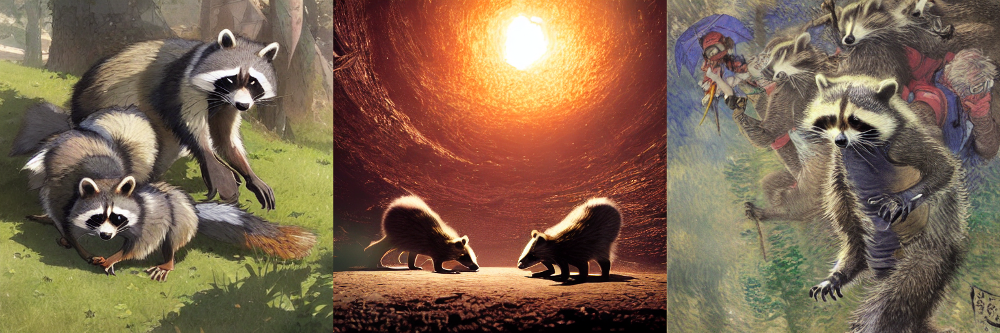

In [ ]:
grid

## Training

Yolov8 is a state-of-the-art object detection algorithm that provides pretrained models on the COCO dataset, which can be used as a starting point for new training. Alternatively, the network can be trained from scratch, but this methodology is not explored in this exercise.

Due to limitations in the environment and long processing times, all our tests had to be conducted only with the pretrained S and N models.

We chose to work with a single algorithm (yolov8) to have a uniform pipeline, that is convenient for labeling and training. We did not explore different hyperparameters as this was already done in the previous assignment. Instead we just used the best settings from before. Of course, there are other algorithms for object detection, but they require different bounding box formatting.

The `train` function is the main function that enables training. Specifically, it takes instructions regarding the model to use (i.e., the initial weights that YOLO will use), the path to the YAML file, and the drive folder path where the obtained results should be stored for later predictions. Hyperparameters are also defined, and they have default values in case they are not set manually; these defaults are the standard values used by YOLO.


In [ ]:
def train(model, yaml_path, output_name, output_path,epochs, optimizer='auto', batch_size=16, lr0=0.01, lrf=0.01):

  model = YOLO(model)  # load a pretrained model

  results = model.train(data=yaml_path,
                        epochs=epochs,
                        imgsz=640,
                        batch=batch_size,
                        name=output_name,
                        project=output_path,
                        lr0=lr0,
                        lrf=lrf,
                        optimizer=optimizer,
                        val=True
                        )
  model.export(format='engine', half=True)
  return results

We will use the technique of transfer learning to train the old model on the newly generated images.

The best model from the previous training on raccons was train_100ep_2000img. We are going to use the model obtained from it to retrain on our new generated dataset and we are doing again some evaluations. We also retrained the second best model, which is called "train_animal_det", to have another model for comparison.


### Baseline

Here we define a baseline using YOLO v8 Nano, trained on the generated data for 50 epochs.

In [ ]:
model ='yolov8n.pt'
epochs = 50
batch_size = 16
yaml_path = f'{path_raccoon_imgen}/data.yaml'
output_path = f'{path_raccoon_yolo}/runs'
output_name = "baseline"
optimizer='auto'
lr0=0.01
lrf=0.01

results_baseline = train(model, yaml_path, output_name, output_path, epochs,optimizer)

New https://pypi.org/project/ultralytics/8.1.5 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/gdrive/MyDrive/final-proj/data/raccoon-imgen/data.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/gdrive/MyDrive/final-proj/yolo_raccoons/yolo_raccoons_generator/runs, name=baseline, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_lab

### Model S 100 epochs animal detection

In [ ]:
model = f'{path_raccoon_yolo}/runs/train_100ep_700img_animal_det/weights/best.pt'
epochs = 100
batch_size = 16
yaml_path = f'{path_raccoon_imgen}/data.yaml'
output_path = f'{path_raccoon_yolo}/runs'
output_name = "retraining_animal_det"
optimizer='auto'
lr0=0.01
lrf=0.01

results_retraining_animal_det = train(model, yaml_path, output_name, output_path, epochs,optimizer)

New https://pypi.org/project/ultralytics/8.1.5 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/gdrive/MyDrive/final-proj/yolo_raccoons/yolo_raccoons_generator/runs/train_100ep_700img_animal_det/weights/best.pt, data=/content/gdrive/MyDrive/final-proj/data/raccoon-imgen/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/gdrive/MyDrive/final-proj/yolo_raccoons/yolo_raccoons_generator/runs, name=retraining_animal_det, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_

### Model S 100 epochs 380 generated images

In [ ]:
model = f'{path_raccoon_yolo}/runs/trainS_100ep_2000img/weights/best.pt'
epochs = 100
batch_size = 16
yaml_path = f'{path_raccoon_imgen}/data.yaml'
output_path = f'{path_raccoon_yolo}/runs'
output_name = "retraining"
optimizer='auto'
lr0=0.01
lrf=0.01

results_retraining = train(model, yaml_path, output_name, output_path, epochs,optimizer)


New https://pypi.org/project/ultralytics/8.1.5 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/gdrive/MyDrive/Faculdade/CompViz/final-proj/yolo_raccoons/yolo_raccoons_generator/runs/trainS_100ep_2000img/weights/best.pt, data=/content/gdrive/MyDrive/Faculdade/CompViz/final-proj/data/raccoon-imgen/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/gdrive/MyDrive/Faculdade/CompViz/final-proj/yolo_raccoons/yolo_raccoons_generator/runs, name=retraining, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybr

## Evaluation and comparison

We used Tensorflow to plot and compare the different training sessions.
TensorBoard allows to monitor and visualize various metrics during the training process. This includes metrics such as loss, accuracy, and other.

The most valuable metrics here are box_loss and cls_loss.

- box_loss shows the amount of error in detected bounding boxes.
- cls_loss shows the amount of error in detected object classes.

There are two losses because the model might correctly detect the bounding box coordinates around the object, but incorrectly detect the object class in this box. In this case the cls_loss is irrelevant since there is only one object(class) to detect so is either "Raccoon" or the box is not detected at all.


Another valuable quality metric is mAP50, which is Mean Average Precision with more than 50% of confidence.

(if is not possible to visualize the TensorBoard, attached to the notebook there is a pdf with some screens of the graphs obtained in TensorBoard)

In [ ]:
%tensorboard --logdir /content/gdrive/MyDrive/final-proj/yolo_raccoons/yolo_raccoons_generator/runs/

Reusing TensorBoard on port 6007 (pid 10543), started 0:18:55 ago. (Use '!kill 10543' to kill it.)

<IPython.core.display.Javascript object>

This method performs the evaluation of the specified model's performance. Specifically, the parameter to pass is the path of the .pt file of the model you want to test.

The output provides the evaluation metrics of the model.

In [ ]:
# Evaluate the model's performance on the validation set
def evaluation (path):

  model = YOLO(path)  # load a custom model

  metrics = model.val()
  print(metrics)
  return metrics.results_dict

Following we execute the evaluation of both the old and the new models.

**Model S 100 epochs 2000 images**

In [ ]:
train_100ep_2000img = evaluation(f'/content/gdrive/MyDrive/yolo_raccoons_big/runs/trainS_100ep_2000img/weights/best.pt')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/gdrive/MyDrive/yolo_raccoons_big/valid/labels.cache... 89 images, 11 backgrounds, 0 corrupt: 100%|██████████| 100/100 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]
                   all        100        103      0.752      0.852      0.752      0.578
Speed: 0.8ms preprocess, 14.8ms inference, 0.0ms loss, 10.1ms postprocess per image
Results saved to runs/detect/val


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b28db4341c0>
fitness: 0.595741991689064
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.57839])
names: {0: 'Raccoon'}
plot: True
results_dict: {'metrics/precision(B)': 0.7515893667272806, 'metrics/recall(B)': 0.8518817827996827, 'metrics/mAP50(B)': 0.7518885089603493, 'metrics/mAP50-95(B)': 0.5783923786589212, 'fitness': 0.595741991689064}
save_dir: PosixPath('runs/detect/val')
speed: {'preprocess': 0.8408427238464355, 'inference': 14.774360656738281, 'loss': 0.0015163421630859375, 'postprocess': 10.078740119934082}


**Model S 101 epochs 380 generated images**

In [ ]:
retraining_evaluation = evaluation(f'{path_raccoon_yolo}/runs/retraining2/weights/best.pt')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/gdrive/MyDrive/Faculdade/CompViz/final-proj/data/raccoon-imgen/valid/labels.cache... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:02<00:00,  1.23it/s]
                   all         44         59      0.846      0.881       0.94       0.53
Speed: 0.5ms preprocess, 11.3ms inference, 0.0ms loss, 5.6ms postprocess per image
Results saved to runs/detect/val5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b28f4fb7ac0>
fitness: 0.5712790027769232
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.53028])
names: {0: 'Raccoon'}
plot: True
results_dict: {'metrics/precision(B)': 0.8464432684710022, 'metrics/recall(B)': 0.8813559322033898, 'metrics/mAP50(B)': 0.940260855537813, 'metrics/mAP50-95(B)': 0.5302810191368243, 'fitness': 0.5712790027769232}
save_dir: PosixPath('runs/detect/val5')
speed: {'preprocess': 0.5476203831759365, 'inference': 11.335990645668724, 'loss': 0.0016418370333584874, 'postprocess': 5.646998232061213}


**Model S 100 epochs animal dataset**

In [ ]:
retraining_evaluation_animal_det = evaluation(f'{path_raccoon_yolo}/runs/retraining_animal_det4/weights/best.pt')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/gdrive/MyDrive/final-proj/data/raccoon-imgen/valid/labels... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<00:00, 101.04it/s]
val: New cache created: /content/gdrive/MyDrive/final-proj/data/raccoon-imgen/valid/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.04s/it]
                   all         44         59      0.836      0.952      0.935       0.55
Speed: 0.3ms preprocess, 18.4ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to runs/detect/val11


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b28dc1aa140>
fitness: 0.5883105555230117
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.54978])
names: {0: 'Raccoon'}
plot: True
results_dict: {'metrics/precision(B)': 0.8362330397291887, 'metrics/recall(B)': 0.9520458074055218, 'metrics/mAP50(B)': 0.9350543709854438, 'metrics/mAP50-95(B)': 0.5497834649160748, 'fitness': 0.5883105555230117}
save_dir: PosixPath('runs/detect/val11')
speed: {'preprocess': 0.2657175064086914, 'inference': 18.433814698999576, 'loss': 0.0013817440379749646, 'postprocess': 4.866865548220548}


**Baseline**

In [ ]:
baseline_evaluation = evaluation(f'{path_raccoon_yolo}/runs/baseline/weights/best.pt')

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/gdrive/MyDrive/final-proj/data/raccoon-imgen/valid/labels.cache... 44 images, 0 backgrounds, 0 corrupt: 100%|██████████| 44/44 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:03<00:00,  1.13s/it]
                   all         44         59      0.891       0.97      0.974      0.553
Speed: 0.4ms preprocess, 7.1ms inference, 0.0ms loss, 5.8ms postprocess per image
Results saved to runs/detect/val12


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b289c1b2170>
fitness: 0.5947078031941594
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.55251])
names: {0: 'Raccoon'}
plot: True
results_dict: {'metrics/precision(B)': 0.8909767893955796, 'metrics/recall(B)': 0.9696451425801718, 'metrics/mAP50(B)': 0.9744888912505314, 'metrics/mAP50-95(B)': 0.5525099045212292, 'fitness': 0.5947078031941594}
save_dir: PosixPath('runs/detect/val12')
speed: {'preprocess': 0.39926984093405987, 'inference': 7.062906568700617, 'loss': 0.0013871626420454545, 'postprocess': 5.766754800623113}


Here, a summary table is presented that compares the results obtained from the evaluations of various training sessions.

In [ ]:
import pandas as pd
from tabulate import tabulate


def results_table(names, data):
  # Add an additional column for dictionary names
  columns = ['Trainings'] + list(data[0].keys())

  # Create a DataFrame
  df = pd.DataFrame(columns=columns)

  # Populate the DataFrame with dictionary values
  for i, d in enumerate(data):
      df.loc[i] = [names[i]] + list(d.values())

  # Display the DataFrame using tabulate for a prettier format
  table = tabulate(df, headers='keys', tablefmt='pretty', showindex=False)

  # Print the formatted table
  print(table)


In [ ]:
#comparison of the two results obtained from the trainings
names = ['train_100ep_2000img','retraining','retraining_animal_det','baseline']
data = [train_100ep_2000img,retraining_evaluation,retraining_evaluation_animal_det,baseline_evaluation]

results_table(names, data)

+-----------------------+----------------------+--------------------+--------------------+---------------------+--------------------+
|       Trainings       | metrics/precision(B) | metrics/recall(B)  |  metrics/mAP50(B)  | metrics/mAP50-95(B) |      fitness       |
+-----------------------+----------------------+--------------------+--------------------+---------------------+--------------------+
|  train_100ep_2000img  |  0.7515893667272806  | 0.8518817827996827 | 0.7518885089603493 | 0.5783923786589212  | 0.595741991689064  |
|      retraining       |  0.8464432684710022  | 0.8813559322033898 | 0.940260855537813  | 0.5302810191368243  | 0.5712790027769232 |
| retraining_animal_det |  0.8362330397291887  | 0.9520458074055218 | 0.9350543709854438 | 0.5497834649160748  | 0.5883105555230117 |
|       baseline        |  0.8909767893955796  | 0.9696451425801718 | 0.9744888912505314 | 0.5525099045212292  | 0.5947078031941594 |
+-----------------------+----------------------+--------------

### Predicting bounding boxes with models

In [ ]:

def draw_image(image_file, box,conf,cls):
    image = cv2.imread(image_file) #load image

    for i in range(0, len(box)): #loop over bboxes
        c = round(conf[i],2)
        xmin = float(box[i][0]) #def bbox proportions
        ymin = float(box[i][1])
        xmax = float(box[i][2])
        ymax = float(box[i][3])

        image = cv2.rectangle(image, (int(xmin), int(ymin)), (int(xmax), int(ymax)), (0,0,255), 3) #draw bbox
        image = cv2.putText(image, cls+ str(c), (int(xmin), int(ymin-5)), cv2.FONT_HERSHEY_SIMPLEX, 1.1, (0, 0, 255), 3) #render text

    return image #return image

def box_on_image(model,image_path,cls):
  model = YOLO(model) # Load a pretrained model

  # Run inference on 'bus.jpg'
  results = model(image_path)  # results list

  for r in results:
      box = r.boxes.xyxy.tolist() #Boxes object containing the detection bounding boxes
      conf = r.boxes.conf.tolist() #confidence

  image = draw_image(image_path,box,conf,cls)
  plt.imshow(image)


#### Model S 100ep 2000img


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon1.png: 640x640 1 Raccoon, 25.9ms
Speed: 3.6ms preprocess, 25.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


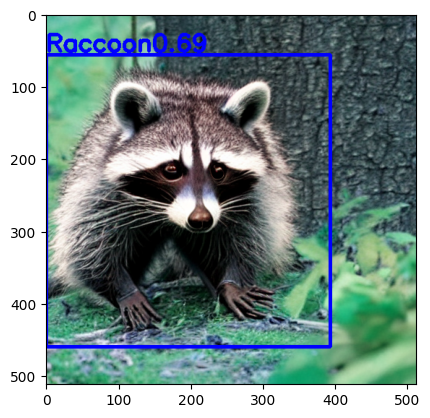

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/trainS_100ep_2000img/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon1.png','Raccoon')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon2.png: 640x640 2 Raccoons, 16.4ms
Speed: 3.5ms preprocess, 16.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


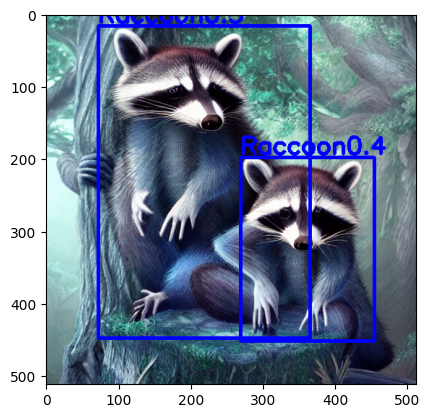

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/trainS_100ep_2000img/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon2.png','Raccoon')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon3.png: 640x640 1 Raccoon, 22.8ms
Speed: 3.5ms preprocess, 22.8ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)


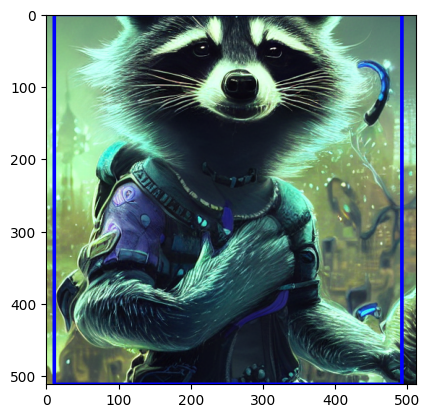

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/trainS_100ep_2000img/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon3.png','Raccoon')

#### Model S 101 epochs 380 generated images


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon1.png: 640x640 1 Raccoon, 16.3ms
Speed: 4.2ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


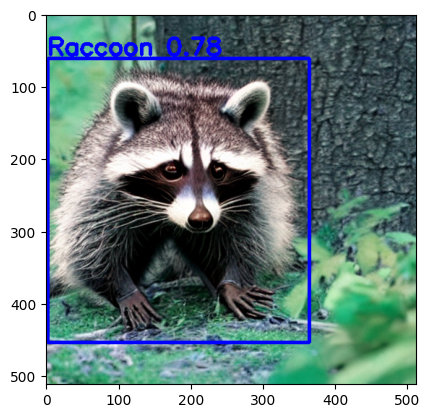

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/retraining2/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon1.png','Raccoon ')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon2.png: 640x640 4 Raccoons, 16.3ms
Speed: 3.2ms preprocess, 16.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)


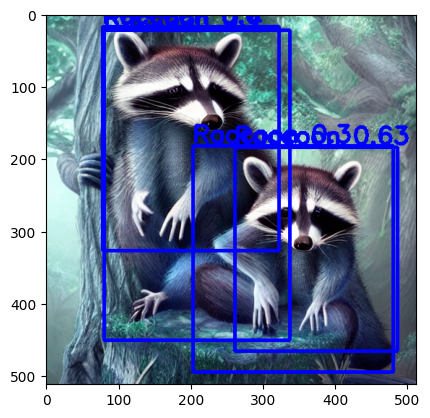

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/retraining2/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon2.png','Raccoon ')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon3.png: 640x640 2 Raccoons, 16.3ms
Speed: 3.3ms preprocess, 16.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


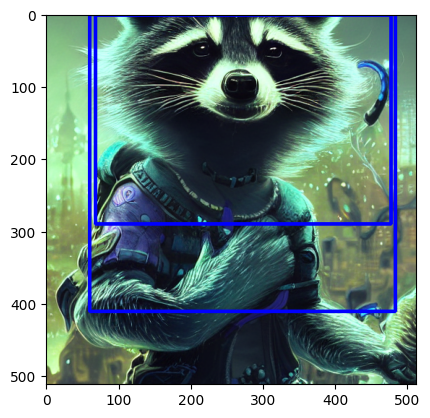

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/retraining2/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon3.png','Raccoon ')

####  Model S 100 epochs animal dataset



image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon1.png: 640x640 1 Raccoon, 15.9ms
Speed: 3.9ms preprocess, 15.9ms inference, 8.1ms postprocess per image at shape (1, 3, 640, 640)


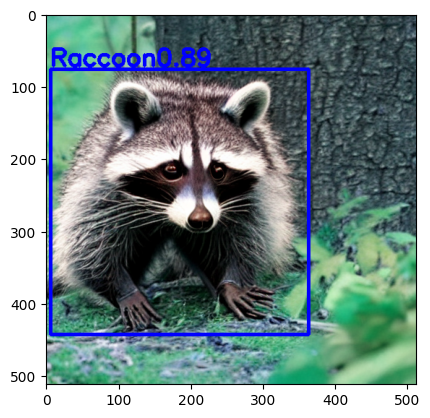

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/retraining_animal_det4/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon1.png','Raccoon')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon2.png: 640x640 2 Raccoons, 7.3ms
Speed: 2.4ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


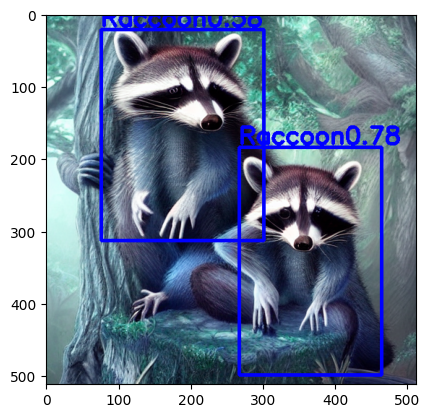

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/retraining_animal_det4/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon2.png','Raccoon')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon3.png: 640x640 1 Raccoon, 15.6ms
Speed: 3.5ms preprocess, 15.6ms inference, 12.1ms postprocess per image at shape (1, 3, 640, 640)


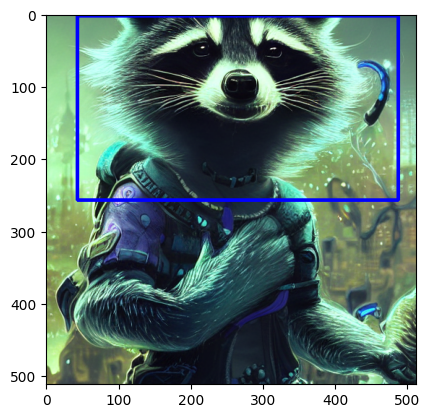

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/retraining_animal_det4/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon3.png','Raccoon')

#### Baseline



image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon1.png: 640x640 1 Raccoon, 9.7ms
Speed: 3.4ms preprocess, 9.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


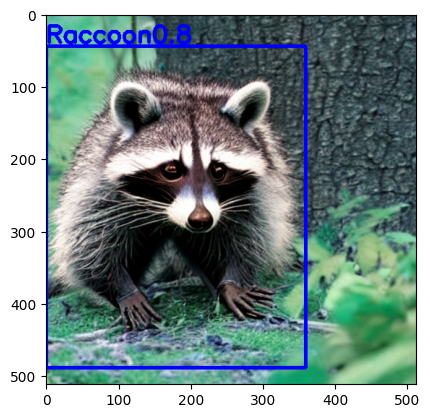

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/baseline/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon1.png','Raccoon')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon2.png: 640x640 2 Raccoons, 7.3ms
Speed: 2.5ms preprocess, 7.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


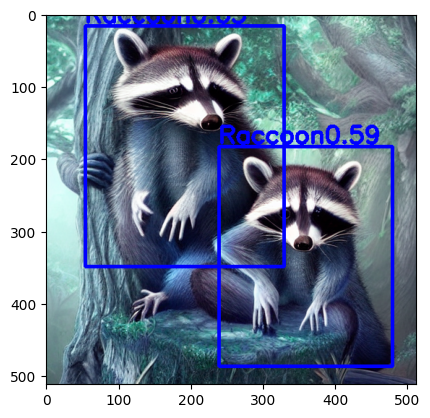

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/baseline/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon2.png','Raccoon')


image 1/1 /content/gdrive/MyDrive/final-proj/images/racoon3.png: 640x640 1 Raccoon, 33.5ms
Speed: 3.5ms preprocess, 33.5ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


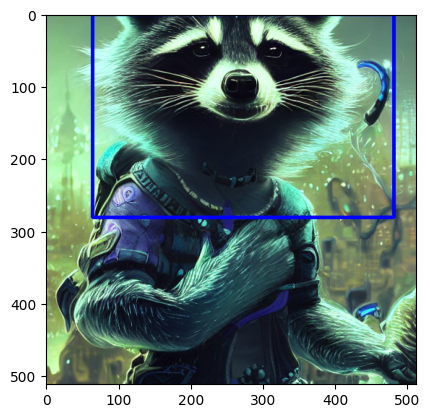

In [ ]:
box_on_image(f'{path_raccoon_yolo}/runs/baseline/weights/best.pt','/content/gdrive/MyDrive/final-proj/images/racoon3.png','Raccoon')

## Conclusion

The 'baseline' model shows the best overall performance in terms of precision, recall, mAP50, and mAP50-95. This indicates that the original YOLOv8 Nano model trained on the initial dataset of AI-generated raccoon images performed well. This may be due to the fact that yolo is trained on the COCO dataset, which is precisely a dataset of animal images and being state of the art is obviously very performant.

The "retraining" model achieved a high precision and mAP50, but its mAP50-95 is relatively lower. This suggests that the model might be struggling with generalization to unseen data, leading to a decrease in performance on a wider range of object variations.

The "retraining_animal_det" model performed well, especially in terms of recall. However, its mAP50-95 is still lower compared to the baseline. It seems to have improved the model's ability to detect animals, but there is room for enhancement in handling a broader set of object variations.

The "train_100ep_2000img" model has lower precision, recall, and mAP50 compared to the others. It might need more training data or adjustments in training parameters to improve performance. This means that the the AI images actually improved the performances.


Let's delve into a more detailed comparison of the key performance metrics between the "retraining" model and the "train_100ep_2000img" model:

Precision:
Retraining Model: 0.85
Train_100ep_2000img Model: 0.75
* The "retraining" model achieves a higher precision, indicating that when it predicts an object, it is more likely to be correct. This is beneficial in scenarios where false positives need to be minimized.

Recall:
Retraining Model: 0.88
Train_100ep_2000img Model: 0.85
* The "train_100ep_2000img" model has a slightly higher recall, implying that it captures a larger proportion of actual positive instances. This is important when it is crucial not to miss any relevant objects.

mAP50 (Mean Average Precision at 50% IoU threshold):
Retraining Model: 0.94
Train_100ep_2000img Model: 0.75
* The "retraining" model significantly outperforms the "train_100ep_2000img" model in terms of mAP50, suggesting superior overall object detection performance across different confidence thresholds.

mAP50-95 (Mean Average Precision from 50% to 95% IoU threshold):
Retraining Model: 0.53
Train_100ep_2000img Model: 0.58
* The "train_100ep_2000img" model has a slightly higher mAP50-95, indicating better performance in handling a wider range of object variations. However, both models show room for improvement in this aspect.

Recommendations:
- Consider increasing the dataset size with diverse raccoon images to enhance generalization is the first step to achieve better results.
- experiment with augmentations and regularization techniques during training to improve generalization.
- Analyze misclassifications and adjust the training strategy accordingly.
- Evaluate and adjust the threshold for confidence scores to balance precision and recall.
- Experiment with learning rates, batch sizes, and other hyperparameters to find the optimal configuration.

Conclusion:
The "retraining" model excels in terms of precision and mAP50, making it well-suited for scenarios where high-confidence detections are crucial.

The "train_100ep_2000img" model performs slightly better in recall and mAP50-95, indicating a better ability to generalize across a wider range of object variations.

Ultimately, the choice between these models depends on the specific requirements and priorities of the application, whether it prioritizes high precision, recall, or a balance between the two.

We can notice some positive effects of using AI-generated images on the specific performance measures provided:

* Increased Diversity: The increased diversity from AI-generated images likely contributes to the higher precision (0.85) and mAP50 (0.94) observed in the "retraining" model. This diversity helps the model generalize better to different object variations, resulting in more accurate and confident predictions.
* Data Augmentation: Data augmentation from AI-generated images might positively impact recall (0.88) by providing the model with a broader set of examples. This helps the model capture a larger proportion of actual positive instances, improving recall.

# References

### GitHub Repository:

1. **Texar-PyTorch - GPT-2 Example**
   - [Link to GitHub Repository](https://github.com/asyml/texar-pytorch/blob/master/examples/gpt-2/README.md)

### Hugging Face Transformers Documentation:

2. **Hugging Face - Transformers Library - GPT-2 Model Documentation**
   - [Link to Hugging Face Documentation](https://huggingface.co/docs/transformers/model_doc/gpt2)

### Roboflow:

3. **Roboflow - Image Processing and Data Augmentation Platform**
   - [Roboflow Website](https://roboflow.com/)
   - Dataset built - [Raccoon ImgGen](https://app.roboflow.com/racoonsimgen/raccoon-imgen/1)

### YOLOv8 (You Only Look Once Version 8):

4. **YOLOv8 GitHub Repository**
   - [YOLOv8 GitHub Repository](https://github.com/ultralytics/ultralytics)